### 딥러닝 CNN 프로젝트

#### 요가 자세 분류
- 사전 훈련 모델 + 분류기(고용량)

#### 랜덤한 8개의 이미지 확인

In [3]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

root = './datasets/Yoga/original/'

idg = ImageDataGenerator(rescale=1./255)

generator = idg.flow_from_directory(root, target_size = (150, 150), batch_size=32, class_mode='categorical')
print(generator.class_indices)

Found 5991 images belonging to 107 classes.
{'adho mukha svanasana': 0, 'adho mukha vriksasana': 1, 'agnistambhasana': 2, 'ananda balasana': 3, 'anantasana': 4, 'anjaneyasana': 5, 'ardha bhekasana': 6, 'ardha chandrasana': 7, 'ardha matsyendrasana': 8, 'ardha pincha mayurasana': 9, 'ardha uttanasana': 10, 'ashtanga namaskara': 11, 'astavakrasana': 12, 'baddha konasana': 13, 'bakasana': 14, 'balasana': 15, 'bhairavasana': 16, 'bharadvajasana i': 17, 'bhekasana': 18, 'bhujangasana': 19, 'bhujapidasana': 20, 'bitilasana': 21, 'camatkarasana': 22, 'chakravakasana': 23, 'chaturanga dandasana': 24, 'dandasana': 25, 'dhanurasana': 26, 'durvasasana': 27, 'dwi pada viparita dandasana': 28, 'eka pada koundinyanasana i': 29, 'eka pada koundinyanasana ii': 30, 'eka pada rajakapotasana': 31, 'eka pada rajakapotasana ii': 32, 'ganda bherundasana': 33, 'garbha pindasana': 34, 'garudasana': 35, 'gomukhasana': 36, 'halasana': 37, 'hanumanasana': 38, 'janu sirsasana': 39, 'kapotasana': 40, 'krounchasana

In [4]:
target_name = {v : k for k, v in generator.class_indices.items()}
print(target_name)

{0: 'adho mukha svanasana', 1: 'adho mukha vriksasana', 2: 'agnistambhasana', 3: 'ananda balasana', 4: 'anantasana', 5: 'anjaneyasana', 6: 'ardha bhekasana', 7: 'ardha chandrasana', 8: 'ardha matsyendrasana', 9: 'ardha pincha mayurasana', 10: 'ardha uttanasana', 11: 'ashtanga namaskara', 12: 'astavakrasana', 13: 'baddha konasana', 14: 'bakasana', 15: 'balasana', 16: 'bhairavasana', 17: 'bharadvajasana i', 18: 'bhekasana', 19: 'bhujangasana', 20: 'bhujapidasana', 21: 'bitilasana', 22: 'camatkarasana', 23: 'chakravakasana', 24: 'chaturanga dandasana', 25: 'dandasana', 26: 'dhanurasana', 27: 'durvasasana', 28: 'dwi pada viparita dandasana', 29: 'eka pada koundinyanasana i', 30: 'eka pada koundinyanasana ii', 31: 'eka pada rajakapotasana', 32: 'eka pada rajakapotasana ii', 33: 'ganda bherundasana', 34: 'garbha pindasana', 35: 'garudasana', 36: 'gomukhasana', 37: 'halasana', 38: 'hanumanasana', 39: 'janu sirsasana', 40: 'kapotasana', 41: 'krounchasana', 42: 'kurmasana', 43: 'lolasana', 44: 

In [5]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

def show_images(generator, ncols=8):

    random_indices = np.random.choice(len(generator.filepaths), 8, replace=False)
    #print(random_indices)

    target_name = {v : k for k, v in generator.class_indices.items()}
    
    target_names = []
    
    for target in generator.classes:
        target_names.append(target_name[target])

    # print(target_names)
    images = []
    indices= []

    
    for index in random_indices:
        image = cv2.cvtColor(cv2.imread(generator.filepaths[index]), cv2.COLOR_BGR2RGB)
        images.append(image)
        indices.append(index)
    
    fig, axes = plt.subplots(figsize=(22, 6), nrows=1, ncols=ncols)
    for i, index in zip(range(ncols), indices):
        axes[i].imshow(images[i])
        axes[i].axis('off')
        axes[i].set_title(target_names[index])


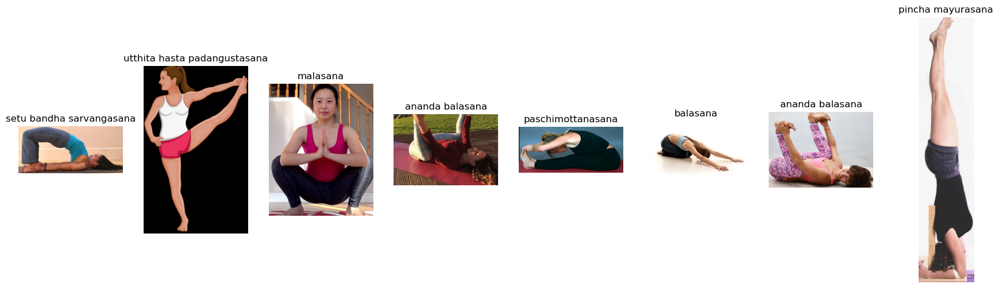

In [24]:
show_images(generator)

#### 데이터 프레임 형태로 만들어서 파일 분리합니다.

In [6]:
target_names = []
for target in generator.classes:
    target_names.append(target_name[target])


In [7]:
import pandas as pd

y_df = pd.DataFrame({'file_paths': generator.filepaths, 'target_names': target_names, 'targets': generator.classes})
y_df.file_paths = y_df.file_paths.apply(lambda file_path: file_path.replace('\\', '/'))
y_df

,file_paths,target_names,targets
0,./datasets/Yoga/original/adho mukha svanasana/...,adho mukha svanasana,0
1,./datasets/Yoga/original/adho mukha svanasana/...,adho mukha svanasana,0
2,./datasets/Yoga/original/adho mukha svanasana/...,adho mukha svanasana,0
3,./datasets/Yoga/original/adho mukha svanasana/...,adho mukha svanasana,0
4,./datasets/Yoga/original/adho mukha svanasana/...,adho mukha svanasana,0
...,...,...,...
5986,./datasets/Yoga/original/yoganidrasana/86-0.png,yoganidrasana,106
5987,./datasets/Yoga/original/yoganidrasana/87-0.png,yoganidrasana,106
5988,./datasets/Yoga/original/yoganidrasana/9-0.png,yoganidrasana,106
5989,./datasets/Yoga/original/yoganidrasana/91-1.png,yoganidrasana,106


In [8]:
from sklearn.model_selection import train_test_split

train_images, test_images, train_targets, test_targets = \
train_test_split(y_df.file_paths, 
                 y_df.targets, 
                 stratify=y_df.targets, 
                 test_size=0.2, random_state=124)


train_images, validation_images, train_targets, validation_targets = \
train_test_split(train_images, 
                 train_targets, 
                 stratify=train_targets, 
                 test_size=0.2, random_state=124)

print(test_targets.value_counts())
print(train_targets.value_counts())
print(test_targets.value_counts())

targets
8     18
24    18
21    17
89    17
35    16
      ..
2      7
38     7
48     7
83     6
53     3
Name: count, Length: 107, dtype: int64
targets
24    58
8     58
21    56
89    56
14    50
      ..
2     21
48    21
11    21
83    20
53    12
Name: count, Length: 107, dtype: int64
targets
8     18
24    18
21    17
89    17
35    16
      ..
2      7
38     7
48     7
83     6
53     3
Name: count, Length: 107, dtype: int64


In [9]:
train_df = y_df.iloc[train_images.index].reset_index(drop=True)
validation_df = y_df.iloc[validation_images.index].reset_index(drop=True)
test_df = y_df.iloc[test_images.index].reset_index(drop=True)

print(train_df.shape)
print(validation_df.shape)
print(test_df.shape)

(3833, 3)
(959, 3)
(1199, 3)


### 사용할 사전 모델
- ResNet
- Xception

탐색해본 결과, ResNet과 Xception이 고용량 훈련에 적합한 모델이라는 것을 알게 되었습니다.  
이에 따라, ResNet 중에서는 resnet50, Xception을 이용해서 훈련을 진행합니다.

In [8]:
from tensorflow.keras.applications.resnet50 import preprocess_input
from tensorflow.keras.preprocessing.image import ImageDataGenerator


IMAGE_SIZE = 150
BATCH_SIZE = 64

train_generator = ImageDataGenerator(preprocessing_function=preprocess_input)
validation_generator = ImageDataGenerator(preprocessing_function=preprocess_input)
test_generator = ImageDataGenerator(preprocessing_function=preprocess_input)

train_flow = train_generator.flow_from_dataframe(
    dataframe=train_df,
    x_col = 'file_paths',
    y_col = 'target_names',
    target_size = (IMAGE_SIZE, IMAGE_SIZE),
    batch_size = BATCH_SIZE,
    class_mode = 'categorical',
    shuffle = True
)

validation_flow = validation_generator.flow_from_dataframe(
    dataframe=validation_df,
    x_col = 'file_paths',
    y_col = 'target_names',
    target_size = (IMAGE_SIZE, IMAGE_SIZE),
    batch_size = BATCH_SIZE,
    class_mode = 'categorical'
)

test_flow = test_generator.flow_from_dataframe(
    dataframe=test_df,
    x_col = 'file_paths',
    y_col = 'target_names',
    target_size = (IMAGE_SIZE, IMAGE_SIZE),
    batch_size = BATCH_SIZE,
    class_mode = 'categorical'
)

print(train_flow.class_indices)
print(validation_flow.class_indices)
print(test_flow.class_indices)

Found 3833 validated image filenames belonging to 107 classes.
Found 959 validated image filenames belonging to 107 classes.
Found 1199 validated image filenames belonging to 107 classes.
{'adho mukha svanasana': 0, 'adho mukha vriksasana': 1, 'agnistambhasana': 2, 'ananda balasana': 3, 'anantasana': 4, 'anjaneyasana': 5, 'ardha bhekasana': 6, 'ardha chandrasana': 7, 'ardha matsyendrasana': 8, 'ardha pincha mayurasana': 9, 'ardha uttanasana': 10, 'ashtanga namaskara': 11, 'astavakrasana': 12, 'baddha konasana': 13, 'bakasana': 14, 'balasana': 15, 'bhairavasana': 16, 'bharadvajasana i': 17, 'bhekasana': 18, 'bhujangasana': 19, 'bhujapidasana': 20, 'bitilasana': 21, 'camatkarasana': 22, 'chakravakasana': 23, 'chaturanga dandasana': 24, 'dandasana': 25, 'dhanurasana': 26, 'durvasasana': 27, 'dwi pada viparita dandasana': 28, 'eka pada koundinyanasana i': 29, 'eka pada koundinyanasana ii': 30, 'eka pada rajakapotasana': 31, 'eka pada rajakapotasana ii': 32, 'ganda bherundasana': 33, 'garbh

In [9]:
import numpy as np
from tensorflow.keras.utils import Sequence
from sklearn.utils import shuffle
import cv2

IMAGE_SIZE = 150
BATCH_SIZE = 64

class Dataset(Sequence):
    def __init__(self, file_paths, targets, batch_size=BATCH_SIZE, aug=None, shuffle=False):
        self.file_paths = file_paths
        self.targets = targets
        self.batch_size = batch_size
        self.aug = aug
        self.shuffle = shuffle

        if self.shuffle:
            self.on_epoch_end()

    def __len__(self):
        return int(np.ceil(len(self.targets) / self.batch_size))

    def __getitem__(self, index):
        file_paths_batch = self.file_paths[index * self.batch_size: (index + 1) * self.batch_size]
        targets_batch = self.targets[index * self.batch_size: (index + 1) * self.batch_size]
        results_batch = np.zeros((file_paths_batch.shape[0], IMAGE_SIZE, IMAGE_SIZE, 3))

        for i in range(file_paths_batch.shape[0]):
            image = cv2.cvtColor(cv2.imread(file_paths_batch[i]), cv2.COLOR_BGR2RGB)
            image = cv2.resize(image, (IMAGE_SIZE, IMAGE_SIZE))

            if self.aug is not None:
                image = self.aug(image=image)['image']

            results_batch[i] = image

        return results_batch, targets_batch

    def on_epoch_end(self):
        if self.shuffle:
            self.file_paths, self.targets = shuffle(self.file_paths, self.targets)

In [10]:
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense , Conv2D , Dropout , Flatten , Activation, MaxPooling2D , GlobalAveragePooling2D
from tensorflow.keras.layers import BatchNormalization

from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.applications import ResNet50V2
from tensorflow.keras.applications import Xception
from tensorflow.keras.applications import MobileNetV2

def create_model(model_name='vgg16', verbose=False):
    input_tensor = Input(shape=(IMAGE_SIZE, IMAGE_SIZE, 3))
    if model_name == 'vgg16':
        model = VGG16(input_tensor=input_tensor, include_top=False, weights='imagenet')
    elif model_name == 'resnet50': # ResNet50, 74.9% ; ResNet50V2, 76.0%
        model = ResNet50V2(input_tensor=input_tensor, include_top=False, weights='imagenet')
    elif model_name == 'xception': # Inception을 기초로 한 모델
        model = Xception(input_tensor=input_tensor, include_top=False, weights='imagenet')
    elif model_name == 'mobilenet':
        model = MobileNetV2(input_tensor=input_tensor, include_top=False, weights='imagenet')

    x = model.output

    # 분류기
    x = GlobalAveragePooling2D()(x)
    if model_name != 'vgg16':
        x = Dropout(rate=0.5)(x)
    x = Dense(500, activation='relu')(x)
    if model_name != 'vgg16':
        x = Dropout(rate=0.5)(x)
    output = Dense(107, activation='softmax', name='output')(x)
    
    model = Model(inputs=input_tensor, outputs=output)
    
    if verbose:
        model.summary()
    
    return model

In [34]:
from tensorflow.keras.losses import CategoricalCrossentropy
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.metrics import Accuracy

model = create_model(model_name='resnet50', verbose=True)
model.compile(optimizer=Adam(), loss=CategoricalCrossentropy(), metrics=['acc'])

94668760/94668760 ━━━━━━━━━━━━━━━━━━━━ 75s 1us/step


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                  ┃ Output Shape              ┃         Param # ┃ Connected to               ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)      │ (None, 150, 150, 3)       │               0 │ -                          │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv1_pad (ZeroPadding2D)     │ (None, 156, 156, 3)       │               0 │ input_layer[0][0]          │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv1_conv (Conv2D)           │ (None, 75, 75, 64)        │           9,472 │ conv1_pad[0][0]            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ pool1_pad (ZeroPadding2D)     │ (None, 77, 77, 64)        │               0 │ conv1_conv[0][0]           │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ pool1_pool (MaxPooling2D)     │ (None, 38, 38, 64)        │               0 │ pool1_pad[0][0]            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_preact_bn        │ (None, 38, 38, 64)        │             256 │ pool1_pool[0][0]           │
│ (BatchNormalization)          │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_preact_relu      │ (None, 38, 38, 64)        │               0 │ conv2_block1_preact_bn[0]… │
│ (Activation)                  │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_1_conv (Conv2D)  │ (None, 38, 38, 64)        │           4,096 │ conv2_block1_preact_relu[… │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_1_bn             │ (None, 38, 38, 64)        │             256 │ conv2_block1_1_conv[0][0]  │
│ (BatchNormalization)          │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_1_relu           │ (None, 38, 38, 64)        │               0 │ conv2_block1_1_bn[0][0]    │
│ (Activation)                  │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_2_pad            │ (None, 40, 40, 64)        │               0 │ conv2_block1_1_relu[0][0]  │
│ (ZeroPadding2D)               │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_2_conv (Conv2D)  │ (None, 38, 38, 64)        │          36,864 │ conv2_block1_2_pad[0][0]   │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_2_bn             │ (None, 38, 38, 64)        │             256 │ conv2_block1_2_conv[0][0]  │
│ (BatchNormalization)          │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_2_relu           │ (None, 38, 38, 64)        │               0 │ conv2_block1_2_bn[0][0]    │
│ (Activation)                  │                           │               

 Total params: 24,642,907 (94.01 MB)

 Trainable params: 24,597,467 (93.83 MB)

 Non-trainable params: 45,440 (177.50 KB)

In [11]:
from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau, EarlyStopping
from IPython.display import Audio

sound_file = './sounds/test.mp3'

mcp_cb = ModelCheckpoint(
    filepath="./callback_files/weights.{epoch:03d}-{val_loss:.4f}-{acc:.4f}.weights.h5",
    monitor='val_loss',
    save_best_only=False,
    save_weights_only=True,
    mode='min'
)

rlr_cb = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.1,
    patience=8,
    mode='min'
)

ely_cb = EarlyStopping(
    monitor='val_loss',
    patience=8,
    mode='min'
)

In [38]:
N_EPOCHS = 10

history = model.fit(train_flow,
                    batch_size=BATCH_SIZE,
                    epochs=N_EPOCHS, 
                    validation_data=validation_flow,
                    callbacks=[mcp_cb, rlr_cb, ely_cb])

Audio(sound_file, autoplay=True)

Epoch 1/10


C:\ProgramData\anaconda3\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - acc: 0.0123 - loss: 4.8089

C:\ProgramData\anaconda3\Lib\site-packages\PIL\Image.py:981: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


60/60 ━━━━━━━━━━━━━━━━━━━━ 87s 1s/step - acc: 0.0125 - loss: 4.8065 - val_acc: 0.0240 - val_loss: 9.2233 - learning_rate: 0.0010
Epoch 2/10
60/60 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - acc: 0.0717 - loss: 4.2125 - val_acc: 0.0501 - val_loss: 6.1210 - learning_rate: 0.0010
Epoch 3/10
60/60 ━━━━━━━━━━━━━━━━━━━━ 73s 1s/step - acc: 0.2271 - loss: 3.1329 - val_acc: 0.0970 - val_loss: 3.9664 - learning_rate: 0.0010
Epoch 4/10
60/60 ━━━━━━━━━━━━━━━━━━━━ 73s 1s/step - acc: 0.3239 - loss: 2.5017 - val_acc: 0.3326 - val_loss: 2.8666 - learning_rate: 0.0010
Epoch 5/10
60/60 ━━━━━━━━━━━━━━━━━━━━ 73s 1s/step - acc: 0.4390 - loss: 1.9362 - val_acc: 0.3764 - val_loss: 2.8869 - learning_rate: 0.0010
Epoch 6/10
60/60 ━━━━━━━━━━━━━━━━━━━━ 74s 1s/step - acc: 0.5510 - loss: 1.5047 - val_acc: 0.4557 - val_loss: 2.2326 - learning_rate: 0.0010
Epoch 7/10
60/60 ━━━━━━━━━━━━━━━━━━━━ 74s 1s/step - acc: 0.6055 - loss: 1.2759 - val_acc: 0.4682 - val_loss: 2.0596 - learning_rate: 0.0010
Epoch 8/10
60/60 ━━━━━━━━━━━━━━

In [39]:
model.evaluate(test_flow)

19/19 ━━━━━━━━━━━━━━━━━━━━ 6s 313ms/step - acc: 0.6549 - loss: 1.3843


[1.4051662683486938, 0.6346955895423889]

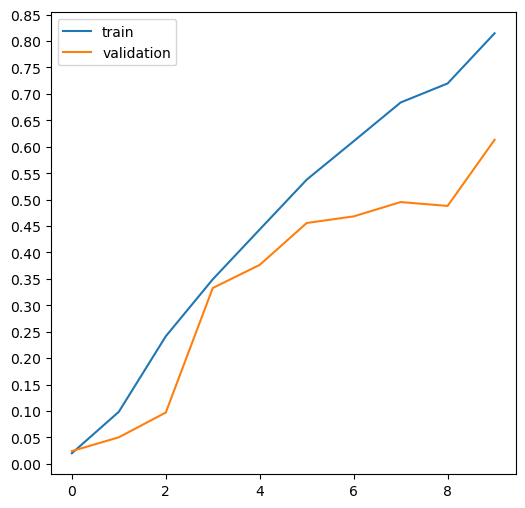

In [40]:
import matplotlib.pyplot as plt

def show_history(history):
    plt.figure(figsize=(6, 6))
    plt.yticks(np.arange(0, 1, 0.05))
    plt.plot(history.history['acc'], label='train')
    plt.plot(history.history['val_acc'], label='validation')
    plt.legend()
    
show_history(history)

In [45]:
import numpy as np
from tensorflow.keras.preprocessing.image import load_img, img_to_array


def show_image(image):
    plt.figure(figsize=(4, 4))
    plt.imshow(image)
    plt.axis('off')

def get_prediction_from_generator(image, image_size=(64, 64)):
    image = cv2.resize(image, image_size)
    image = img_to_array(image)
    
    image = np.expand_dims(image, axis=0)
    prediction = model.predict(image)

    # print(prediction)
    # print(target_name)
    for i, prediction in enumerate(prediction):
        print(i, prediction)
        predicted_class_index = np.argmax(prediction)
        predicted_class_label = target_name[predicted_class_index]
    
    return predicted_class_label

def get_prediction_from_web(image):
    
    image = img_to_array(image)
    
    image = np.expand_dims(image, axis=0)
    prediction = model.predict(image)

    # print(prediction)
    # print(target_name)
    for i, prediction in enumerate(prediction):
        print(i, prediction)
        predicted_class_index = np.argmax(prediction)
        predicted_class_label = target_name[predicted_class_index]
    
    return predicted_class_label


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 863ms/step
0 [1.70693554e-07 2.84383859e-05 5.39442181e-06 2.14685383e-06
 7.95373637e-07 1.39238523e-06 1.38840251e-05 8.92530991e-08
 1.30338871e-04 3.38449411e-08 2.72178168e-05 2.13020758e-06
 1.20055993e-05 1.06993306e-03 1.35881392e-05 1.01636564e-04
 3.04934110e-05 8.18706121e-06 1.64137000e-05 3.48734079e-06
 8.87282833e-04 2.15864611e-06 3.74630140e-08 1.49050757e-05
 1.39947008e-06 1.77643835e-06 5.41588852e-05 3.50160553e-05
 7.22954337e-06 2.90263279e-06 1.90997571e-06 2.91591452e-04
 2.75372621e-03 3.03530891e-04 7.37323353e-05 6.65502084e-05
 2.68442500e-06 3.69157374e-06 1.45008926e-07 5.49502787e-04
 1.05915853e-04 8.22552320e-05 4.76201531e-05 2.96732382e-04
 3.75636262e-07 9.21276296e-07 7.16966810e-03 3.41446867e-04
 1.95713142e-06 4.84774318e-07 2.82411315e-06 1.79276822e-06
 1.72566752e-06 2.97698262e-03 4.32770730e-06 4.15783550e-04
 3.14839303e-06 8.55482449e-06 7.22953928e-07 3.09102603e-07
 3.11021176e-06 1.22539286e-05 9.70625222e-0

'pasasana'

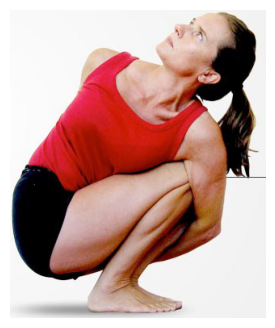

In [47]:
import cv2
import matplotlib.pyplot as plt

# rgb한장 가져와서 보기
image = cv2.cvtColor(cv2.imread(test_flow.filepaths[100]), cv2.COLOR_BGR2RGB)
show_image(image)
get_prediction_from_generator(image, image_size=(150,150))

#### 예측 수행

In [87]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

IMAGE_SIZE = 150

def get_prediction_from_generator(image, image_size=(IMAGE_SIZE, IMAGE_SIZE)):
    print(image.shape)
    image = cv2.resize(image, image_size)
    image = img_to_array(image)
    
    image = np.expand_dims(image, axis=0)
    prediction = model.predict(image)

    # print(prediction)
    # print(target_name)
    for i, prediction in enumerate(prediction):
        print(i, prediction)
        predicted_class_index = np.argmax(prediction)
        predicted_class_label = target_name[predicted_class_index]
    
    return predicted_class_label

def predict_images(flow, image_size=IMAGE_SIZE, ncols=8):
    random_indices = np.random.choice(len(flow.filepaths), 8, replace=False)
    #print(random_indices)

    target_name = {v : k for k, v in generator.class_indices.items()}
    target_names = []
    
    for target in generator.classes:
        target_names.append(target_name[target])

    # print(target_names)
    images = []
    indices= []
    predicts=[]
    
    for index in random_indices:
        image = cv2.cvtColor(cv2.imread(generator.filepaths[index]), cv2.COLOR_BGR2RGB)
        images.append(image)
        indices.append(index)
        prediction = get_prediction_from_generator(image)
        predicts.append(prediction)
        
    fig, axes = plt.subplots(figsize=(22, 6), nrows=1, ncols=ncols)
    for i, index in zip(range(ncols), indices):
        # print(i, index)
        axes[i].imshow(images[i])
        # axes[i].axis('off')
        axes[i].set_title(f'Answer : {target_names[index]}')
        axes[i].set_xlabel(f'Predict : {predicts[i]}')
        


(433, 640, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
0 [2.1251671e-08 2.1288599e-05 3.8910039e-07 3.2613827e-06 7.6852899e-08
 1.3320057e-07 9.5971991e-06 2.0779191e-07 2.5584241e-08 1.3069426e-07
 1.0457207e-07 1.9487316e-06 9.8789889e-01 3.0576808e-05 2.0220975e-06
 5.7730308e-06 5.8683258e-04 9.7035935e-09 1.3068704e-05 1.4968077e-05
 1.1773086e-05 8.4198842e-07 2.1744025e-08 5.6763099e-07 2.4201653e-03
 2.7099148e-08 8.7524526e-08 1.8950803e-07 2.4426979e-06 3.1096140e-05
 4.6110418e-04 8.8518491e-06 1.1355902e-05 4.5856837e-08 4.5511106e-07
 1.1681249e-06 3.4063216e-08 5.7860939e-06 2.3514741e-09 8.1717830e-05
 9.1568859e-07 5.8942579e-08 3.8079845e-05 6.9736725e-06 1.6316847e-03
 5.0968492e-06 5.2787109e-05 2.9729770e-06 3.5870215e-08 3.2913533e-08
 4.5156571e-06 9.7799475e-06 1.7165880e-07 3.2648366e-08 3.1725037e-07
 1.8552988e-07 1.8069331e-07 1.8099452e-06 5.5461663e-07 2.3045425e-08
 4.0955529e-05 2.1275812e-07 3.4330824e-07 7.6796948e-07 1.2617078e-04
 3.8362938e-08 2.851770

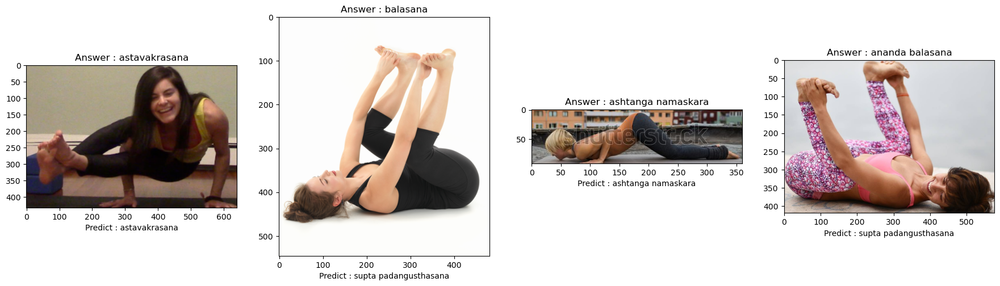

In [88]:
# image = cv2.cvtColor(cv2.imread(test_flow.filepaths[100]), cv2.COLOR_BGR2RGB)
# get_prediction_from_generator(image)
predict_images(test_flow, ncols=4)

### Cycle2
- 정확도를 올리기 위해, epoch를 20으로 조정후 다시 훈련을 진행합니다.

In [94]:
from tensorflow.keras.losses import CategoricalCrossentropy
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.metrics import Accuracy

model = create_model(model_name='resnet50', verbose=True)
model.compile(optimizer=Adam(), loss=CategoricalCrossentropy(), metrics=['acc'])

Model: "functional_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                  ┃ Output Shape              ┃         Param # ┃ Connected to               ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)    │ (None, 150, 150, 3)       │               0 │ -                          │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv1_pad (ZeroPadding2D)     │ (None, 156, 156, 3)       │               0 │ input_layer_2[0][0]        │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv1_conv (Conv2D)           │ (None, 75, 75, 64)        │           9,472 │ conv1_pad[0][0]            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ pool1_pad (ZeroPadding2D)     │ (None, 77, 77, 64)        │               0 │ conv1_conv[0][0]           │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ pool1_pool (MaxPooling2D)     │ (None, 38, 38, 64)        │               0 │ pool1_pad[0][0]            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_preact_bn        │ (None, 38, 38, 64)        │             256 │ pool1_pool[0][0]           │
│ (BatchNormalization)          │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_preact_relu      │ (None, 38, 38, 64)        │               0 │ conv2_block1_preact_bn[0]… │
│ (Activation)                  │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_1_conv (Conv2D)  │ (None, 38, 38, 64)        │           4,096 │ conv2_block1_preact_relu[… │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_1_bn             │ (None, 38, 38, 64)        │             256 │ conv2_block1_1_conv[0][0]  │
│ (BatchNormalization)          │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_1_relu           │ (None, 38, 38, 64)        │               0 │ conv2_block1_1_bn[0][0]    │
│ (Activation)                  │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_2_pad            │ (None, 40, 40, 64)        │               0 │ conv2_block1_1_relu[0][0]  │
│ (ZeroPadding2D)               │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_2_conv (Conv2D)  │ (None, 38, 38, 64)        │          36,864 │ conv2_block1_2_pad[0][0]   │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_2_bn             │ (None, 38, 38, 64)        │             256 │ conv2_block1_2_conv[0][0]  │
│ (BatchNormalization)          │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_2_relu           │ (None, 38, 38, 64)        │               0 │ conv2_block1_2_bn[0][0]    │
│ (Activation)                  │                           │               

 Total params: 24,642,907 (94.01 MB)

 Trainable params: 24,597,467 (93.83 MB)

 Non-trainable params: 45,440 (177.50 KB)

In [95]:
N_EPOCHS = 20

history = model.fit(train_flow,
                    batch_size=BATCH_SIZE,
                    epochs=N_EPOCHS, 
                    validation_data=validation_flow,
                    callbacks=[mcp_cb, rlr_cb, ely_cb])

Audio(sound_file, autoplay=True)

Epoch 1/20
60/60 ━━━━━━━━━━━━━━━━━━━━ 91s 1s/step - acc: 0.0164 - loss: 4.8244 - val_acc: 0.0292 - val_loss: 6.4979 - learning_rate: 0.0010
Epoch 2/20
60/60 ━━━━━━━━━━━━━━━━━━━━ 74s 1s/step - acc: 0.0746 - loss: 4.1406 - val_acc: 0.0667 - val_loss: 7.4635 - learning_rate: 0.0010
Epoch 3/20
60/60 ━━━━━━━━━━━━━━━━━━━━ 75s 1s/step - acc: 0.2040 - loss: 3.2463 - val_acc: 0.1241 - val_loss: 6.0108 - learning_rate: 0.0010
Epoch 4/20
60/60 ━━━━━━━━━━━━━━━━━━━━ 74s 1s/step - acc: 0.3270 - loss: 2.4864 - val_acc: 0.2565 - val_loss: 3.1406 - learning_rate: 0.0010
Epoch 5/20
60/60 ━━━━━━━━━━━━━━━━━━━━ 75s 1s/step - acc: 0.4419 - loss: 1.9930 - val_acc: 0.3243 - val_loss: 2.8603 - learning_rate: 0.0010
Epoch 6/20
60/60 ━━━━━━━━━━━━━━━━━━━━ 74s 1s/step - acc: 0.5295 - loss: 1.6164 - val_acc: 0.3827 - val_loss: 2.6505 - learning_rate: 0.0010
Epoch 7/20
60/60 ━━━━━━━━━━━━━━━━━━━━ 73s 1s/step - acc: 0.6188 - loss: 1.2945 - val_acc: 0.4432 - val_loss: 2.1480 - learning_rate: 0.0010
Epoch 8/20
60/60 ━━━

In [96]:
model.evaluate(test_flow)

19/19 ━━━━━━━━━━━━━━━━━━━━ 6s 301ms/step - acc: 0.5474 - loss: 2.2350


[2.221235513687134, 0.5346121788024902]

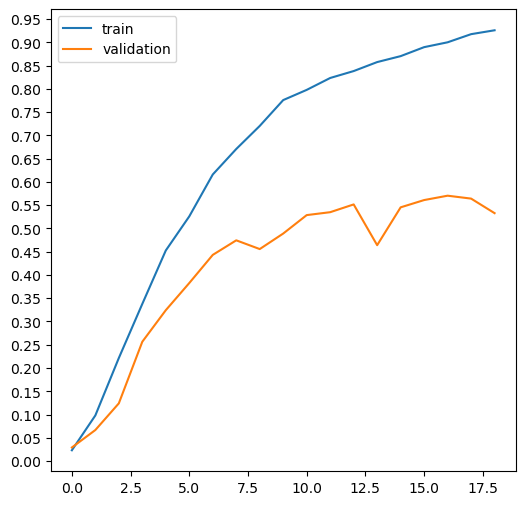

In [97]:
import matplotlib.pyplot as plt

def show_history(history):
    plt.figure(figsize=(6, 6))
    plt.yticks(np.arange(0, 1, 0.05))
    plt.plot(history.history['acc'], label='train')
    plt.plot(history.history['val_acc'], label='validation')
    plt.legend()
    
show_history(history)

### Cycle 3
- learning rate를 조정해서 다시 훈련을 합니다.

In [12]:
from tensorflow.keras.losses import CategoricalCrossentropy
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.metrics import Accuracy

model = create_model(model_name='resnet50', verbose=True)
model.compile(optimizer=Adam(1e-5), loss=CategoricalCrossentropy(), metrics=['acc'])

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                  ┃ Output Shape              ┃         Param # ┃ Connected to               ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)      │ (None, 150, 150, 3)       │               0 │ -                          │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv1_pad (ZeroPadding2D)     │ (None, 156, 156, 3)       │               0 │ input_layer[0][0]          │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv1_conv (Conv2D)           │ (None, 75, 75, 64)        │           9,472 │ conv1_pad[0][0]            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ pool1_pad (ZeroPadding2D)     │ (None, 77, 77, 64)        │               0 │ conv1_conv[0][0]           │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ pool1_pool (MaxPooling2D)     │ (None, 38, 38, 64)        │               0 │ pool1_pad[0][0]            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_preact_bn        │ (None, 38, 38, 64)        │             256 │ pool1_pool[0][0]           │
│ (BatchNormalization)          │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_preact_relu      │ (None, 38, 38, 64)        │               0 │ conv2_block1_preact_bn[0]… │
│ (Activation)                  │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_1_conv (Conv2D)  │ (None, 38, 38, 64)        │           4,096 │ conv2_block1_preact_relu[… │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_1_bn             │ (None, 38, 38, 64)        │             256 │ conv2_block1_1_conv[0][0]  │
│ (BatchNormalization)          │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_1_relu           │ (None, 38, 38, 64)        │               0 │ conv2_block1_1_bn[0][0]    │
│ (Activation)                  │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_2_pad            │ (None, 40, 40, 64)        │               0 │ conv2_block1_1_relu[0][0]  │
│ (ZeroPadding2D)               │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_2_conv (Conv2D)  │ (None, 38, 38, 64)        │          36,864 │ conv2_block1_2_pad[0][0]   │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_2_bn             │ (None, 38, 38, 64)        │             256 │ conv2_block1_2_conv[0][0]  │
│ (BatchNormalization)          │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_2_relu           │ (None, 38, 38, 64)        │               0 │ conv2_block1_2_bn[0][0]    │
│ (Activation)                  │                           │               

 Total params: 24,642,907 (94.01 MB)

 Trainable params: 24,597,467 (93.83 MB)

 Non-trainable params: 45,440 (177.50 KB)

In [14]:
N_EPOCHS = 20

history = model.fit(train_flow,
                    batch_size=BATCH_SIZE,
                    epochs=N_EPOCHS, 
                    validation_data=validation_flow,
                    callbacks=[mcp_cb, rlr_cb, ely_cb])

Audio(sound_file, autoplay=True)

Epoch 1/20


C:\ProgramData\anaconda3\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - acc: 0.0112 - loss: 5.6873

C:\ProgramData\anaconda3\Lib\site-packages\PIL\Image.py:981: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


60/60 ━━━━━━━━━━━━━━━━━━━━ 80s 1s/step - acc: 0.0112 - loss: 5.6860 - val_acc: 0.0209 - val_loss: 5.0292 - learning_rate: 1.0000e-05
Epoch 2/20
60/60 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - acc: 0.0122 - loss: 5.2365 - val_acc: 0.0219 - val_loss: 4.7537 - learning_rate: 1.0000e-05
Epoch 3/20
60/60 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - acc: 0.0176 - loss: 4.7850 - val_acc: 0.0229 - val_loss: 4.6651 - learning_rate: 1.0000e-05
Epoch 4/20
60/60 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - acc: 0.0196 - loss: 4.6729 - val_acc: 0.0229 - val_loss: 4.6347 - learning_rate: 1.0000e-05
Epoch 5/20
60/60 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - acc: 0.0231 - loss: 4.6272 - val_acc: 0.0313 - val_loss: 4.6200 - learning_rate: 1.0000e-05
Epoch 6/20
60/60 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - acc: 0.0260 - loss: 4.5995 - val_acc: 0.0407 - val_loss: 4.6047 - learning_rate: 1.0000e-05
Epoch 7/20
60/60 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - acc: 0.0232 - loss: 4.5820 - val_acc: 0.0396 - val_loss: 4.5903 - learning_rate: 1.0000e-05
Epo

### Cycle 4
- epoch를 더욱 늘려서 훈련을 진행
- learning_rate 를 5e-4로 값을 올림

In [17]:
from tensorflow.keras.losses import CategoricalCrossentropy
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.metrics import Accuracy

model = create_model(model_name='resnet50', verbose=True)
model.compile(optimizer=Adam(5e-4), loss=CategoricalCrossentropy(), metrics=['acc'])

Model: "functional_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                  ┃ Output Shape              ┃         Param # ┃ Connected to               ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)    │ (None, 150, 150, 3)       │               0 │ -                          │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv1_pad (ZeroPadding2D)     │ (None, 156, 156, 3)       │               0 │ input_layer_2[0][0]        │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv1_conv (Conv2D)           │ (None, 75, 75, 64)        │           9,472 │ conv1_pad[0][0]            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ pool1_pad (ZeroPadding2D)     │ (None, 77, 77, 64)        │               0 │ conv1_conv[0][0]           │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ pool1_pool (MaxPooling2D)     │ (None, 38, 38, 64)        │               0 │ pool1_pad[0][0]            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_preact_bn        │ (None, 38, 38, 64)        │             256 │ pool1_pool[0][0]           │
│ (BatchNormalization)          │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_preact_relu      │ (None, 38, 38, 64)        │               0 │ conv2_block1_preact_bn[0]… │
│ (Activation)                  │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_1_conv (Conv2D)  │ (None, 38, 38, 64)        │           4,096 │ conv2_block1_preact_relu[… │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_1_bn             │ (None, 38, 38, 64)        │             256 │ conv2_block1_1_conv[0][0]  │
│ (BatchNormalization)          │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_1_relu           │ (None, 38, 38, 64)        │               0 │ conv2_block1_1_bn[0][0]    │
│ (Activation)                  │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_2_pad            │ (None, 40, 40, 64)        │               0 │ conv2_block1_1_relu[0][0]  │
│ (ZeroPadding2D)               │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_2_conv (Conv2D)  │ (None, 38, 38, 64)        │          36,864 │ conv2_block1_2_pad[0][0]   │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_2_bn             │ (None, 38, 38, 64)        │             256 │ conv2_block1_2_conv[0][0]  │
│ (BatchNormalization)          │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_2_relu           │ (None, 38, 38, 64)        │               0 │ conv2_block1_2_bn[0][0]    │
│ (Activation)                  │                           │               

 Total params: 24,642,907 (94.01 MB)

 Trainable params: 24,597,467 (93.83 MB)

 Non-trainable params: 45,440 (177.50 KB)

In [18]:
N_EPOCHS = 80

history = model.fit(train_flow,
                    batch_size=BATCH_SIZE,
                    epochs=N_EPOCHS, 
                    validation_data=validation_flow,
                    callbacks=[mcp_cb, rlr_cb, ely_cb])

Audio(sound_file, autoplay=True)

Epoch 1/80
60/60 ━━━━━━━━━━━━━━━━━━━━ 92s 1s/step - acc: 0.0202 - loss: 4.9034 - val_acc: 0.0532 - val_loss: 4.8881 - learning_rate: 5.0000e-04
Epoch 2/80
60/60 ━━━━━━━━━━━━━━━━━━━━ 77s 1s/step - acc: 0.1049 - loss: 4.0874 - val_acc: 0.2138 - val_loss: 3.6428 - learning_rate: 5.0000e-04
Epoch 3/80
60/60 ━━━━━━━━━━━━━━━━━━━━ 77s 1s/step - acc: 0.2951 - loss: 2.8280 - val_acc: 0.2555 - val_loss: 3.3638 - learning_rate: 5.0000e-04
Epoch 4/80
60/60 ━━━━━━━━━━━━━━━━━━━━ 77s 1s/step - acc: 0.4920 - loss: 1.9179 - val_acc: 0.4213 - val_loss: 2.3900 - learning_rate: 5.0000e-04
Epoch 5/80
60/60 ━━━━━━━━━━━━━━━━━━━━ 76s 1s/step - acc: 0.6133 - loss: 1.3828 - val_acc: 0.4911 - val_loss: 2.0111 - learning_rate: 5.0000e-04
Epoch 6/80
60/60 ━━━━━━━━━━━━━━━━━━━━ 76s 1s/step - acc: 0.7051 - loss: 1.0093 - val_acc: 0.5245 - val_loss: 1.9601 - learning_rate: 5.0000e-04
Epoch 7/80
60/60 ━━━━━━━━━━━━━━━━━━━━ 77s 1s/step - acc: 0.7710 - loss: 0.7882 - val_acc: 0.5610 - val_loss: 1.8102 - learning_rate: 5.0

In [19]:
model.evaluate(test_flow)

19/19 ━━━━━━━━━━━━━━━━━━━━ 6s 330ms/step - acc: 0.5990 - loss: 1.9288


[1.8420617580413818, 0.6113427877426147]

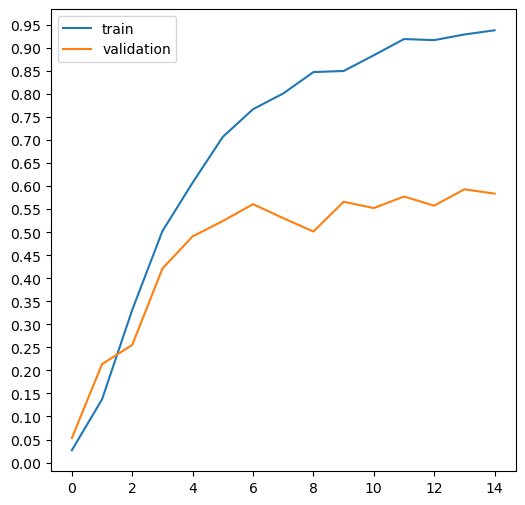

In [20]:
import matplotlib.pyplot as plt

def show_history(history):
    plt.figure(figsize=(6, 6))
    plt.yticks(np.arange(0, 1, 0.05))
    plt.plot(history.history['acc'], label='train')
    plt.plot(history.history['val_acc'], label='validation')
    plt.legend()
    
show_history(history)

In [23]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import load_img, img_to_array

IMAGE_SIZE = 150

def get_prediction_from_generator(image, image_size=(IMAGE_SIZE, IMAGE_SIZE)):
    print(image.shape)
    image = cv2.resize(image, image_size)
    image = img_to_array(image)
    
    image = np.expand_dims(image, axis=0)
    prediction = model.predict(image)

    # print(prediction)
    # print(target_name)
    for i, prediction in enumerate(prediction):
        print(i, prediction)
        predicted_class_index = np.argmax(prediction)
        predicted_class_label = target_name[predicted_class_index]
    
    return predicted_class_label

def predict_images(flow, image_size=IMAGE_SIZE, ncols=8):
    random_indices = np.random.choice(len(flow.filepaths), 8, replace=False)
    #print(random_indices)

    target_name = {v : k for k, v in generator.class_indices.items()}
    target_names = []
    
    for target in generator.classes:
        target_names.append(target_name[target])

    # print(target_names)
    images = []
    indices= []
    predicts=[]
    
    for index in random_indices:
        image = cv2.cvtColor(cv2.imread(generator.filepaths[index]), cv2.COLOR_BGR2RGB)
        images.append(image)
        indices.append(index)
        prediction = get_prediction_from_generator(image)
        predicts.append(prediction)
        
    fig, axes = plt.subplots(figsize=(22, 6), nrows=1, ncols=ncols)
    for i, index in zip(range(ncols), indices):
        # print(i, index)
        axes[i].imshow(images[i])
        # axes[i].axis('off')
        axes[i].set_title(f'Answer : {target_names[index]}')
        axes[i].set_xlabel(f'Predict : {predicts[i]}')
        


(627, 594, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
0 [1.1501477e-05 3.8483430e-04 8.2379535e-07 2.0083728e-06 8.5283921e-07
 2.6087311e-05 1.2984979e-07 4.5549718e-04 1.8782630e-06 7.4125717e-05
 8.9542907e-01 1.7033294e-07 4.9583116e-07 4.4754219e-07 1.6440901e-04
 2.3520602e-06 3.8128762e-06 5.7751470e-07 1.0122038e-06 1.0347240e-05
 1.9534068e-06 4.0892450e-05 3.9410585e-05 1.2899321e-03 2.1455277e-05
 8.3491295e-06 1.3120608e-04 3.4669738e-05 2.2712743e-03 1.3227696e-05
 2.3720816e-06 2.2013051e-06 2.5306232e-05 7.7107223e-04 2.7481002e-07
 9.7857474e-06 4.8929646e-06 3.6993068e-05 6.1580090e-07 1.4619977e-06
 4.0578747e-05 1.0560043e-06 5.7990775e-07 1.2897503e-05 2.6044197e-06
 1.0674322e-05 6.2206500e-06 2.0634695e-07 4.4859294e-07 1.9019791e-04
 1.1229321e-06 6.7888788e-05 1.3736454e-04 1.8119480e-04 8.4351126e-07
 7.5527141e-06 3.0483207e-06 1.2833806e-06 2.0484353e-05 1.5890622e-05
 4.9768023e-05 1.2325448e-03 2.0726336e-06 1.4145783e-06 8.4834770e-05
 8.7083936e-05 3.560741

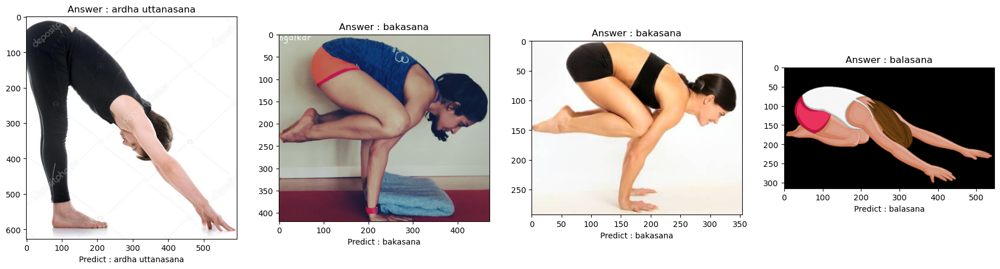

In [64]:
predict_images(test_flow, ncols=4)

### Cycle 5
- albumentations 적용

In [27]:
train_df = y_df.iloc[train_images.index].reset_index(drop=True)
validation_df = y_df.iloc[validation_images.index].reset_index(drop=True)
test_df = y_df.iloc[test_images.index].reset_index(drop=True)

print(train_df.shape)
print(validation_df.shape)
print(test_df.shape)

(3833, 3)
(959, 3)
(1199, 3)


In [11]:
import numpy as np
from tensorflow.keras.utils import Sequence
from sklearn.utils import shuffle
import cv2

IMAGE_SIZE = 150
BATCH_SIZE = 64

class Dataset(Sequence):
    def __init__(self, file_paths, targets, batch_size=BATCH_SIZE, aug=None, preprocess=None, shuffle=False):
        self.file_paths = file_paths
        self.targets = targets
        self.batch_size = batch_size
        self.aug = aug
        self.shuffle = shuffle
        self.preprocess = preprocess
        
        if self.shuffle:
            self.on_epoch_end()

    def __len__(self):
        return int(np.ceil(len(self.targets) / self.batch_size))

    def __getitem__(self, index):
        file_paths_batch = self.file_paths[index * self.batch_size: (index + 1) * self.batch_size]
        targets_batch = self.targets[index * self.batch_size: (index + 1) * self.batch_size]
        results_batch = np.zeros((file_paths_batch.shape[0], IMAGE_SIZE, IMAGE_SIZE, 3))

        for i in range(file_paths_batch.shape[0]):
            image = cv2.cvtColor(cv2.imread(file_paths_batch[i]), cv2.COLOR_BGR2RGB)
            image = cv2.resize(image, (IMAGE_SIZE, IMAGE_SIZE))

            if self.aug is not None:
                image = self.aug(image=image)['image']

            if self.preprocess is not None:
                image = self.preprocess(image)
                
            results_batch[i] = image

        return results_batch, targets_batch

    def on_epoch_end(self):
        if self.shuffle:
            self.file_paths, self.targets = shuffle(self.file_paths, self.targets)

In [47]:
import albumentations as A
from tensorflow.keras.applications.resnet50 import preprocess_input as resnet_preprocess_input

train_file_paths = train_df['file_paths'].values
# train_targets = train_df['targets'].values # SparseCategoricalCrossEntropy
train_targets = pd.get_dummies(train_df['targets']).values # CategoricalCrossEntropy

validation_file_paths = validation_df['file_paths'].values
# validation_targets = validation_df['targets'].values # SparseCategoricalCrossEntropy
validation_targets = pd.get_dummies(validation_df['targets']).values # CategoricalCrossEntropy

test_file_paths = test_df['file_paths'].values
# test_targets = test_df['targets'].values # SparseCategoricalCrossEntropy
test_targets = pd.get_dummies(test_df['targets']).values # CategoricalCrossEntropy

aug = A.Compose([
    A.ShiftScaleRotate(p=0.5),
    A.HorizontalFlip(p=0.5),
    A.GaussNoise(p=0.5, var_limit=(400, 900)),
    A.RandomBrightnessContrast(brightness_limit=0.2, contrast_limit=0, p=0.5)
])

train_dataset = Dataset(train_file_paths, 
                        train_targets, 
                        batch_size=BATCH_SIZE, 
                        aug=aug, 
                        preprocess=resnet_preprocess_input, 
                        shuffle=True)

validation_dataset = Dataset(validation_file_paths, 
                        validation_targets, 
                        batch_size=BATCH_SIZE, 
                        preprocess=resnet_preprocess_input)

test_dataset = Dataset(test_file_paths, 
                        test_targets, 
                        batch_size=BATCH_SIZE, 
                        preprocess=resnet_preprocess_input)

In [48]:
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense , Conv2D , Dropout , Flatten , Activation, MaxPooling2D , GlobalAveragePooling2D
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.regularizers import l2

from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.applications import ResNet50V2
from tensorflow.keras.applications import Xception
from tensorflow.keras.applications import MobileNetV2

def create_model(model_name='vgg16', verbose=False):
    input_tensor = Input(shape=(IMAGE_SIZE, IMAGE_SIZE, 3))
    if model_name == 'vgg16':
        model = VGG16(input_tensor=input_tensor, include_top=False, weights='imagenet')
    elif model_name == 'resnet50': # ResNet50, 74.9% ; ResNet50V2, 76.0%
        model = ResNet50V2(input_tensor=input_tensor, include_top=False, weights='imagenet')
    elif model_name == 'xception': # Inception을 기초로 한 모델
        model = Xception(input_tensor=input_tensor, include_top=False, weights='imagenet')
    elif model_name == 'mobilenet':
        model = MobileNetV2(input_tensor=input_tensor, include_top=False, weights='imagenet')

    x = model.output

    # 분류기
    x = GlobalAveragePooling2D()(x)
    if model_name != 'vgg16':
        x = Dropout(rate=0.5)(x)
    x = Dense(500, activation='relu', )(x)
    if model_name != 'vgg16':
        x = Dropout(rate=0.5)(x)
    output = Dense(107, activation='softmax', name='output')(x)
    
    model = Model(inputs=input_tensor, outputs=output)
    
    if verbose:
        model.summary()
    
    return model

In [49]:
from tensorflow.keras.losses import CategoricalCrossentropy
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.metrics import Accuracy

model = create_model(model_name='resnet50', verbose=True)
model.compile(optimizer=Adam(5e-4), loss=CategoricalCrossentropy(), metrics=['acc'])

Model: "functional_13"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                  ┃ Output Shape              ┃         Param # ┃ Connected to               ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_6 (InputLayer)    │ (None, 150, 150, 3)       │               0 │ -                          │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv1_pad (ZeroPadding2D)     │ (None, 156, 156, 3)       │               0 │ input_layer_6[0][0]        │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv1_conv (Conv2D)           │ (None, 75, 75, 64)        │           9,472 │ conv1_pad[0][0]            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ pool1_pad (ZeroPadding2D)     │ (None, 77, 77, 64)        │               0 │ conv1_conv[0][0]           │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ pool1_pool (MaxPooling2D)     │ (None, 38, 38, 64)        │               0 │ pool1_pad[0][0]            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_preact_bn        │ (None, 38, 38, 64)        │             256 │ pool1_pool[0][0]           │
│ (BatchNormalization)          │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_preact_relu      │ (None, 38, 38, 64)        │               0 │ conv2_block1_preact_bn[0]… │
│ (Activation)                  │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_1_conv (Conv2D)  │ (None, 38, 38, 64)        │           4,096 │ conv2_block1_preact_relu[… │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_1_bn             │ (None, 38, 38, 64)        │             256 │ conv2_block1_1_conv[0][0]  │
│ (BatchNormalization)          │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_1_relu           │ (None, 38, 38, 64)        │               0 │ conv2_block1_1_bn[0][0]    │
│ (Activation)                  │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_2_pad            │ (None, 40, 40, 64)        │               0 │ conv2_block1_1_relu[0][0]  │
│ (ZeroPadding2D)               │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_2_conv (Conv2D)  │ (None, 38, 38, 64)        │          36,864 │ conv2_block1_2_pad[0][0]   │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_2_bn             │ (None, 38, 38, 64)        │             256 │ conv2_block1_2_conv[0][0]  │
│ (BatchNormalization)          │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_2_relu           │ (None, 38, 38, 64)        │               0 │ conv2_block1_2_bn[0][0]    │
│ (Activation)                  │                           │               

 Total params: 24,642,907 (94.01 MB)

 Trainable params: 24,597,467 (93.83 MB)

 Non-trainable params: 45,440 (177.50 KB)

In [50]:
from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau, EarlyStopping
from IPython.display import Audio

sound_file = './sounds/test.mp3'

mcp_cb = ModelCheckpoint(
    filepath="./callback_files/weights.{epoch:03d}-{val_loss:.4f}-{acc:.4f}.weights.h5",
    monitor='val_loss',
    save_best_only=False,
    save_weights_only=True,
    mode='min'
)

rlr_cb = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.1,
    patience=8,
    mode='min'
)

ely_cb = EarlyStopping(
    monitor='val_loss',
    patience=8,
    mode='min'
)

In [51]:
N_EPOCHS = 20

history = model.fit(train_dataset,
                    batch_size=BATCH_SIZE,
                    epochs=N_EPOCHS, 
                    validation_data=validation_dataset,
                    callbacks=[mcp_cb, rlr_cb, ely_cb])

Audio(sound_file, autoplay=True)

Epoch 1/20


C:\ProgramData\anaconda3\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


60/60 ━━━━━━━━━━━━━━━━━━━━ 108s 1s/step - acc: 0.0122 - loss: 4.8974 - val_acc: 0.0229 - val_loss: 4.9888 - learning_rate: 5.0000e-04
Epoch 2/20
60/60 ━━━━━━━━━━━━━━━━━━━━ 77s 1s/step - acc: 0.0323 - loss: 4.5293 - val_acc: 0.0407 - val_loss: 4.8055 - learning_rate: 5.0000e-04
Epoch 3/20
60/60 ━━━━━━━━━━━━━━━━━━━━ 78s 1s/step - acc: 0.0996 - loss: 4.0207 - val_acc: 0.1908 - val_loss: 3.4461 - learning_rate: 5.0000e-04
Epoch 4/20
60/60 ━━━━━━━━━━━━━━━━━━━━ 79s 1s/step - acc: 0.1801 - loss: 3.3054 - val_acc: 0.3014 - val_loss: 3.1609 - learning_rate: 5.0000e-04
Epoch 5/20
60/60 ━━━━━━━━━━━━━━━━━━━━ 79s 1s/step - acc: 0.2935 - loss: 2.7966 - val_acc: 0.3243 - val_loss: 2.6436 - learning_rate: 5.0000e-04
Epoch 6/20
60/60 ━━━━━━━━━━━━━━━━━━━━ 78s 1s/step - acc: 0.3478 - loss: 2.4708 - val_acc: 0.4609 - val_loss: 2.0670 - learning_rate: 5.0000e-04
Epoch 7/20
60/60 ━━━━━━━━━━━━━━━━━━━━ 77s 1s/step - acc: 0.4095 - loss: 2.2376 - val_acc: 0.4692 - val_loss: 1.9958 - learning_rate: 5.0000e-04
Ep

In [53]:
model.evaluate(test_flow)

19/19 ━━━━━━━━━━━━━━━━━━━━ 16s 861ms/step - acc: 0.6690 - loss: 1.4335


[1.3805850744247437, 0.6872393488883972]

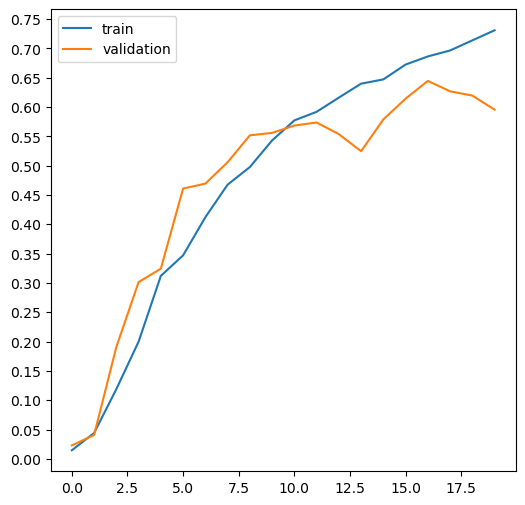

In [54]:
import matplotlib.pyplot as plt

def show_history(history):
    plt.figure(figsize=(6, 6))
    plt.yticks(np.arange(0, 1, 0.05))
    plt.plot(history.history['acc'], label='train')
    plt.plot(history.history['val_acc'], label='validation')
    plt.legend()
    
show_history(history)

In [55]:
import gc
gc.collect()

62142

(360, 547, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
0 [3.08610004e-04 6.53071620e-05 7.33844994e-04 1.09625772e-01
 5.70305972e-04 8.04990821e-04 9.04936623e-03 5.31624428e-05
 1.84199319e-03 1.69248422e-04 2.49298202e-04 1.40060627e-04
 4.60815732e-04 2.36368868e-02 1.01172183e-04 7.26646045e-03
 2.21289331e-04 5.92984818e-03 6.63684262e-03 5.30442633e-02
 1.69300547e-04 1.42139150e-02 2.10879771e-05 7.81529304e-03
 7.84226810e-04 2.02454478e-02 3.26827425e-03 2.82121546e-05
 1.60574346e-04 1.19079763e-04 1.28592088e-04 9.55075622e-02
 2.37454221e-01 1.80763975e-02 7.82709685e-04 2.12218565e-05
 1.17857885e-02 1.13518694e-02 4.26736951e-04 5.77140320e-03
 5.11271181e-03 2.48778239e-03 4.23113932e-04 3.79504672e-05
 7.23877514e-04 8.19501409e-04 3.01853148e-03 1.63431820e-02
 2.43381970e-03 1.75379464e-04 9.04520322e-03 1.02506419e-04
 1.33087407e-04 8.95209159e-05 3.72429425e-03 9.91453417e-05
 2.79402826e-03 5.42254827e-04 7.42565098e-05 3.98334705e-05
 3.61911443e-05 1.77201568e-04 

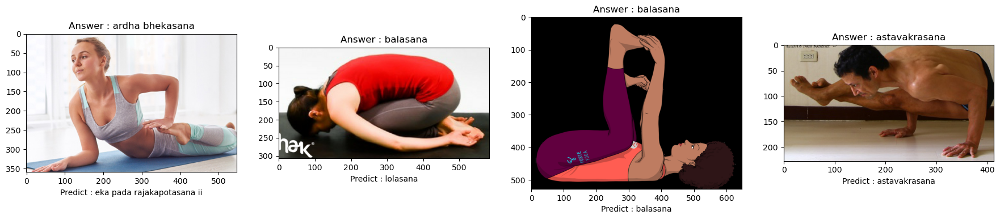

In [57]:
predict_images(test_flow, ncols=4)

### Cycle 6
- MobileNet 으로 변경

In [58]:
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense , Conv2D , Dropout , Flatten , Activation, MaxPooling2D , GlobalAveragePooling2D
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.regularizers import l2

from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.applications import ResNet50V2
from tensorflow.keras.applications import Xception
from tensorflow.keras.applications import MobileNetV2

def create_model(model_name='vgg16', verbose=False):
    input_tensor = Input(shape=(IMAGE_SIZE, IMAGE_SIZE, 3))
    if model_name == 'vgg16':
        model = VGG16(input_tensor=input_tensor, include_top=False, weights='imagenet')
    elif model_name == 'resnet50': # ResNet50, 74.9% ; ResNet50V2, 76.0%
        model = ResNet50V2(input_tensor=input_tensor, include_top=False, weights='imagenet')
    elif model_name == 'xception': # Inception을 기초로 한 모델
        model = Xception(input_tensor=input_tensor, include_top=False, weights='imagenet')
    elif model_name == 'mobilenet':
        model = MobileNetV2(input_tensor=input_tensor, include_top=False, weights='imagenet')

    x = model.output

    # 분류기
    x = GlobalAveragePooling2D()(x)
    if model_name != 'vgg16':
        x = Dropout(rate=0.5)(x)
    x = Dense(500, activation='relu', )(x)
    if model_name != 'vgg16':
        x = Dropout(rate=0.5)(x)
    output = Dense(107, activation='softmax', name='output')(x)
    
    model = Model(inputs=input_tensor, outputs=output)
    
    if verbose:
        model.summary()
    
    return model

In [59]:
import albumentations as A
from tensorflow.keras.applications.mobilenet import preprocess_input as mobile_preprocess_input

train_file_paths = train_df['file_paths'].values
# train_targets = train_df['targets'].values # SparseCategoricalCrossEntropy
train_targets = pd.get_dummies(train_df['targets']).values # CategoricalCrossEntropy

validation_file_paths = validation_df['file_paths'].values
# validation_targets = validation_df['targets'].values # SparseCategoricalCrossEntropy
validation_targets = pd.get_dummies(validation_df['targets']).values # CategoricalCrossEntropy

test_file_paths = test_df['file_paths'].values
# test_targets = test_df['targets'].values # SparseCategoricalCrossEntropy
test_targets = pd.get_dummies(test_df['targets']).values # CategoricalCrossEntropy

aug = A.Compose([
    A.ShiftScaleRotate(p=0.5),
    A.HorizontalFlip(p=0.5),
    A.GaussNoise(p=0.5, var_limit=(400, 900)),
    A.RandomBrightnessContrast(brightness_limit=0.2, contrast_limit=0, p=0.5)
])

train_dataset = Dataset(train_file_paths, 
                        train_targets, 
                        batch_size=BATCH_SIZE, 
                        aug=aug, 
                        preprocess=mobile_preprocess_input, 
                        shuffle=True)

validation_dataset = Dataset(validation_file_paths, 
                        validation_targets, 
                        batch_size=BATCH_SIZE, 
                        preprocess=mobile_preprocess_input)

test_dataset = Dataset(test_file_paths, 
                        test_targets, 
                        batch_size=BATCH_SIZE, 
                        preprocess=mobile_preprocess_input)

In [60]:
from tensorflow.keras.losses import CategoricalCrossentropy
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.metrics import Accuracy

model_mobilenet = create_model(model_name='mobilenet', verbose=True)
model_mobilenet.compile(optimizer=Adam(5e-4), loss=CategoricalCrossentropy(), metrics=['acc'])

C:\Users\kangh\AppData\Local\Temp\ipykernel_9488\1526763536.py:20: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  model = MobileNetV2(input_tensor=input_tensor, include_top=False, weights='imagenet')


Model: "functional_15"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                  ┃ Output Shape              ┃         Param # ┃ Connected to               ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_7 (InputLayer)    │ (None, 150, 150, 3)       │               0 │ -                          │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ Conv1 (Conv2D)                │ (None, 75, 75, 32)        │             864 │ input_layer_7[0][0]        │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ bn_Conv1 (BatchNormalization) │ (None, 75, 75, 32)        │             128 │ Conv1[0][0]                │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ Conv1_relu (ReLU)             │ (None, 75, 75, 32)        │               0 │ bn_Conv1[0][0]             │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ expanded_conv_depthwise       │ (None, 75, 75, 32)        │             288 │ Conv1_relu[0][0]           │
│ (DepthwiseConv2D)             │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ expanded_conv_depthwise_BN    │ (None, 75, 75, 32)        │             128 │ expanded_conv_depthwise[0… │
│ (BatchNormalization)          │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ expanded_conv_depthwise_relu  │ (None, 75, 75, 32)        │               0 │ expanded_conv_depthwise_B… │
│ (ReLU)                        │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ expanded_conv_project         │ (None, 75, 75, 16)        │             512 │ expanded_conv_depthwise_r… │
│ (Conv2D)                      │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ expanded_conv_project_BN      │ (None, 75, 75, 16)        │              64 │ expanded_conv_project[0][… │
│ (BatchNormalization)          │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block_1_expand (Conv2D)       │ (None, 75, 75, 96)        │           1,536 │ expanded_conv_project_BN[… │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block_1_expand_BN             │ (None, 75, 75, 96)        │             384 │ block_1_expand[0][0]       │
│ (BatchNormalization)          │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block_1_expand_relu (ReLU)    │ (None, 75, 75, 96)        │               0 │ block_1_expand_BN[0][0]    │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block_1_pad (ZeroPadding2D)   │ (None, 77, 77, 96)        │               0 │ block_1_expand_relu[0][0]  │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block_1_depthwise             │ (None, 38, 38, 96)        │             864 │ block_1_pad[0][0]          │
│ (DepthwiseConv2D)             │                           │               

 Total params: 2,952,091 (11.26 MB)

 Trainable params: 2,917,979 (11.13 MB)

 Non-trainable params: 34,112 (133.25 KB)

In [61]:
N_EPOCHS = 20

history = model_mobilenet.fit(train_dataset,
                    batch_size=BATCH_SIZE,
                    epochs=N_EPOCHS, 
                    validation_data=validation_dataset,
                    callbacks=[mcp_cb, rlr_cb, ely_cb])

Audio(sound_file, autoplay=True)

Epoch 1/20


C:\ProgramData\anaconda3\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


60/60 ━━━━━━━━━━━━━━━━━━━━ 56s 652ms/step - acc: 0.0107 - loss: 5.0335 - val_acc: 0.0302 - val_loss: 4.7960 - learning_rate: 5.0000e-04
Epoch 2/20
60/60 ━━━━━━━━━━━━━━━━━━━━ 39s 626ms/step - acc: 0.0297 - loss: 4.6108 - val_acc: 0.0574 - val_loss: 4.4194 - learning_rate: 5.0000e-04
Epoch 3/20
60/60 ━━━━━━━━━━━━━━━━━━━━ 40s 626ms/step - acc: 0.0671 - loss: 4.2488 - val_acc: 0.0970 - val_loss: 4.0883 - learning_rate: 5.0000e-04
Epoch 4/20
60/60 ━━━━━━━━━━━━━━━━━━━━ 39s 628ms/step - acc: 0.1614 - loss: 3.5830 - val_acc: 0.1825 - val_loss: 3.4129 - learning_rate: 5.0000e-04
Epoch 5/20
60/60 ━━━━━━━━━━━━━━━━━━━━ 39s 625ms/step - acc: 0.2681 - loss: 2.8885 - val_acc: 0.2836 - val_loss: 2.8950 - learning_rate: 5.0000e-04
Epoch 6/20
60/60 ━━━━━━━━━━━━━━━━━━━━ 40s 635ms/step - acc: 0.3510 - loss: 2.4317 - val_acc: 0.3587 - val_loss: 2.6111 - learning_rate: 5.0000e-04
Epoch 7/20
60/60 ━━━━━━━━━━━━━━━━━━━━ 44s 714ms/step - acc: 0.4549 - loss: 1.9956 - val_acc: 0.2909 - val_loss: 2.9442 - learning

모바일 넷은 오히려 성능이 안좋게 나타났습니다.  
강사님께 자문을 구한 결과, EfficientNet이 성능이 더 좋게 나오는 사전훈련 모델이라는 것을 알게 되었습니다.

### Cycle 7
- EfficientNet으로 변경

In [1]:
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense , Conv2D , Dropout , Flatten , Activation, MaxPooling2D , GlobalAveragePooling2D
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.regularizers import l2

from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.applications import ResNet50V2
from tensorflow.keras.applications import Xception
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.applications import EfficientNetB0

def create_model(model_name='vgg16', verbose=False):
    input_tensor = Input(shape=(IMAGE_SIZE, IMAGE_SIZE, 3))
    if model_name == 'vgg16':
        model = VGG16(input_tensor=input_tensor, include_top=False, weights='imagenet')
    elif model_name == 'resnet50': # ResNet50, 74.9% ; ResNet50V2, 76.0%
        model = ResNet50V2(input_tensor=input_tensor, include_top=False, weights='imagenet')
    elif model_name == 'xception': # Inception을 기초로 한 모델
        model = Xception(input_tensor=input_tensor, include_top=False, weights='imagenet')
    elif model_name == 'mobilenet':
        model = MobileNetV2(input_tensor=input_tensor, include_top=False, weights='imagenet')
    elif model_name == 'efficientnet':
        model = EfficientNetB0(input_tensor=input_tensor, include_top=False, weights='imagenet')
        
    x = model.output

    # 분류기
    x = GlobalAveragePooling2D()(x)
    if model_name != 'vgg16':
        x = Dropout(rate=0.5)(x)
    x = Dense(500, activation='relu', )(x)
    if model_name != 'vgg16':
        x = Dropout(rate=0.5)(x)
    output = Dense(107, activation='softmax', name='output')(x)
    
    model = Model(inputs=input_tensor, outputs=output)
    
    if verbose:
        model.summary()
    
    return model

In [12]:
import albumentations as A
from tensorflow.keras.applications.mobilenet import preprocess_input as mobile_preprocess_input
from tensorflow.keras.applications.efficientnet import preprocess_input as efficient_preprocess_input

train_file_paths = train_df['file_paths'].values
# train_targets = train_df['targets'].values # SparseCategoricalCrossEntropy
train_targets = pd.get_dummies(train_df['targets']).values # CategoricalCrossEntropy

validation_file_paths = validation_df['file_paths'].values
# validation_targets = validation_df['targets'].values # SparseCategoricalCrossEntropy
validation_targets = pd.get_dummies(validation_df['targets']).values # CategoricalCrossEntropy

test_file_paths = test_df['file_paths'].values
# test_targets = test_df['targets'].values # SparseCategoricalCrossEntropy
test_targets = pd.get_dummies(test_df['targets']).values # CategoricalCrossEntropy

aug = A.Compose([
    A.ShiftScaleRotate(p=0.5),
    A.HorizontalFlip(p=0.5),
    A.GaussNoise(p=0.5, var_limit=(400, 900)),
    A.RandomBrightnessContrast(brightness_limit=0.2, contrast_limit=0, p=0.5)
])

train_dataset = Dataset(train_file_paths, 
                        train_targets, 
                        batch_size=BATCH_SIZE, 
                        aug=aug, 
                        preprocess=efficient_preprocess_input, 
                        shuffle=True)

validation_dataset = Dataset(validation_file_paths, 
                        validation_targets, 
                        batch_size=BATCH_SIZE, 
                        preprocess=efficient_preprocess_input)

test_dataset = Dataset(test_file_paths, 
                        test_targets, 
                        batch_size=BATCH_SIZE, 
                        preprocess=efficient_preprocess_input)

In [13]:
from tensorflow.keras.losses import CategoricalCrossentropy
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.metrics import Accuracy

model_efficient = create_model(model_name='efficientnet', verbose=True)
model_efficient.compile(optimizer=Adam(5e-4), loss=CategoricalCrossentropy(), metrics=['acc'])

16705208/16705208 ━━━━━━━━━━━━━━━━━━━━ 13s 1us/step


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                  ┃ Output Shape              ┃         Param # ┃ Connected to               ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)      │ (None, 150, 150, 3)       │               0 │ -                          │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ rescaling (Rescaling)         │ (None, 150, 150, 3)       │               0 │ input_layer[0][0]          │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ normalization (Normalization) │ (None, 150, 150, 3)       │               7 │ rescaling[0][0]            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ rescaling_1 (Rescaling)       │ (None, 150, 150, 3)       │               0 │ normalization[0][0]        │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ stem_conv_pad (ZeroPadding2D) │ (None, 151, 151, 3)       │               0 │ rescaling_1[0][0]          │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ stem_conv (Conv2D)            │ (None, 75, 75, 32)        │             864 │ stem_conv_pad[0][0]        │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ stem_bn (BatchNormalization)  │ (None, 75, 75, 32)        │             128 │ stem_conv[0][0]            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ stem_activation (Activation)  │ (None, 75, 75, 32)        │               0 │ stem_bn[0][0]              │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block1a_dwconv                │ (None, 75, 75, 32)        │             288 │ stem_activation[0][0]      │
│ (DepthwiseConv2D)             │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block1a_bn                    │ (None, 75, 75, 32)        │             128 │ block1a_dwconv[0][0]       │
│ (BatchNormalization)          │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block1a_activation            │ (None, 75, 75, 32)        │               0 │ block1a_bn[0][0]           │
│ (Activation)                  │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block1a_se_squeeze            │ (None, 32)                │               0 │ block1a_activation[0][0]   │
│ (GlobalAveragePooling2D)      │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block1a_se_reshape (Reshape)  │ (None, 1, 1, 32)          │               0 │ block1a_se_squeeze[0][0]   │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block1a_se_reduce (Conv2D)    │ (None, 1, 1, 8)           │             264 │ block1a_se_reshape[0][0]   │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block1a_se_expand (Conv2D)    │ (None, 1, 1, 32)          │             288 │ block1a_se_reduce[0][0]    │
├───────────────────────────────┼───────────────────────────┼───────────────

 Total params: 4,743,678 (18.10 MB)

 Trainable params: 4,701,655 (17.94 MB)

 Non-trainable params: 42,023 (164.16 KB)

In [15]:
from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau, EarlyStopping
from IPython.display import Audio

sound_file = './sounds/test.mp3'

mcp_cb = ModelCheckpoint(
    filepath="./callback_files/weights.{epoch:03d}-{val_loss:.4f}-{acc:.4f}.weights.h5",
    monitor='val_loss',
    save_best_only=False,
    save_weights_only=True,
    mode='min'
)

rlr_cb = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.1,
    patience=8,
    mode='min'
)

ely_cb = EarlyStopping(
    monitor='val_loss',
    patience=8,
    mode='min'
)

In [16]:
N_EPOCHS = 20

history = model_efficient.fit(train_dataset,
                    batch_size=BATCH_SIZE,
                    epochs=N_EPOCHS, 
                    validation_data=validation_dataset,
                    callbacks=[mcp_cb, rlr_cb, ely_cb])



Epoch 1/20


C:\ProgramData\anaconda3\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


60/60 ━━━━━━━━━━━━━━━━━━━━ 72s 863ms/step - acc: 0.0150 - loss: 4.8150 - val_acc: 0.1199 - val_loss: 4.2720 - learning_rate: 5.0000e-04
Epoch 2/20
60/60 ━━━━━━━━━━━━━━━━━━━━ 51s 825ms/step - acc: 0.0860 - loss: 4.2207 - val_acc: 0.3014 - val_loss: 2.8644 - learning_rate: 5.0000e-04
Epoch 3/20
60/60 ━━━━━━━━━━━━━━━━━━━━ 51s 826ms/step - acc: 0.2570 - loss: 3.0921 - val_acc: 0.4911 - val_loss: 1.9207 - learning_rate: 5.0000e-04
Epoch 4/20
60/60 ━━━━━━━━━━━━━━━━━━━━ 50s 818ms/step - acc: 0.4052 - loss: 2.2747 - val_acc: 0.5944 - val_loss: 1.4615 - learning_rate: 5.0000e-04
Epoch 5/20
60/60 ━━━━━━━━━━━━━━━━━━━━ 51s 827ms/step - acc: 0.5131 - loss: 1.7677 - val_acc: 0.6340 - val_loss: 1.2709 - learning_rate: 5.0000e-04
Epoch 6/20
60/60 ━━━━━━━━━━━━━━━━━━━━ 53s 853ms/step - acc: 0.5789 - loss: 1.4518 - val_acc: 0.6465 - val_loss: 1.2722 - learning_rate: 5.0000e-04
Epoch 7/20
60/60 ━━━━━━━━━━━━━━━━━━━━ 58s 934ms/step - acc: 0.6334 - loss: 1.2549 - val_acc: 0.6632 - val_loss: 1.1956 - learning

In [18]:
model_efficient.evaluate(test_dataset)

19/19 ━━━━━━━━━━━━━━━━━━━━ 4s 231ms/step - acc: 0.7300 - loss: 1.2517


[1.272545337677002, 0.7306088209152222]

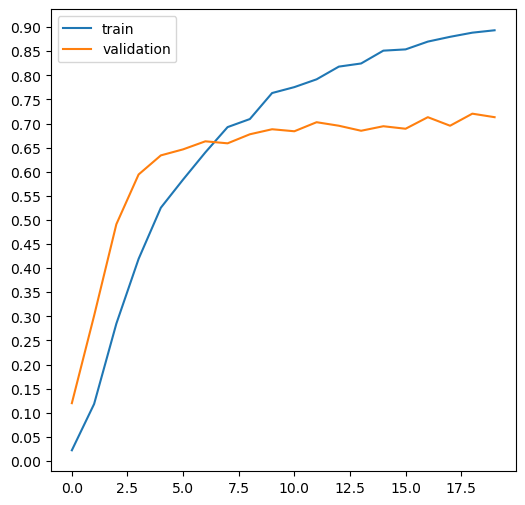

In [20]:
import matplotlib.pyplot as plt

def show_history(history):
    plt.figure(figsize=(6,6))
    plt.yticks(np.arange(0, 1, 0.05))
    plt.plot(history.history['acc'], label='train')
    plt.plot(history.history['val_acc'], label='validation')
    plt.legend()

show_history(history)

#### 예측 수행

In [35]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import load_img, img_to_array

IMAGE_SIZE = 150

def get_prediction_from_generator(image, model, image_size=(IMAGE_SIZE, IMAGE_SIZE)):
    print(image.shape)
    image = cv2.resize(image, image_size)
    image = img_to_array(image)
    
    image = np.expand_dims(image, axis=0)
    prediction = model.predict(image)

    # print(prediction)
    # print(target_name)
    for i, prediction in enumerate(prediction):
        print(i, prediction)
        predicted_class_index = np.argmax(prediction)
        predicted_class_label = target_name[predicted_class_index]
    
    return predicted_class_label

def predict_images(flow, model, image_size=IMAGE_SIZE, ncols=8):
    random_indices = np.random.choice(len(flow.filepaths), 8, replace=False)
    #print(random_indices)

    target_name = {v : k for k, v in generator.class_indices.items()}
    target_names = []
    
    for target in generator.classes:
        target_names.append(target_name[target])

    # print(target_names)
    images = []
    indices= []
    predicts=[]
    
    for index in random_indices:
        image = cv2.cvtColor(cv2.imread(generator.filepaths[index]), cv2.COLOR_BGR2RGB)
        images.append(image)
        indices.append(index)
        prediction = get_prediction_from_generator(image, model)
        predicts.append(prediction)
        
    fig, axes = plt.subplots(figsize=(22, 6), nrows=1, ncols=ncols)
    for i, index in zip(range(ncols), indices):
        # print(i, index)
        axes[i].imshow(images[i])
        axes[i].axis('off')
        axes[i].set_title(f'Answer : {target_names[index]} \n Predict : {predicts[i]}')
        


In [25]:
from tensorflow.keras.applications.resnet50 import preprocess_input
from tensorflow.keras.preprocessing.image import ImageDataGenerator


IMAGE_SIZE = 150
BATCH_SIZE = 64


test_generator = ImageDataGenerator(preprocessing_function=preprocess_input)

test_flow = test_generator.flow_from_dataframe(
    dataframe=test_df,
    x_col = 'file_paths',
    y_col = 'target_names',
    target_size = (IMAGE_SIZE, IMAGE_SIZE),
    batch_size = BATCH_SIZE,
    class_mode = 'categorical'
)

Found 1199 validated image filenames belonging to 107 classes.


(148, 334, 3)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
0 [1.27149060e-05 4.51850701e-06 2.40137098e-07 5.82747191e-07
 2.42651913e-05 7.75017554e-07 8.83444159e-07 1.92617017e-06
 1.36179679e-05 5.37034930e-06 6.28419866e-06 9.42285114e-05
 9.18988109e-01 2.84264456e-06 1.97308674e-03 5.60963053e-05
 1.49287021e-04 1.25296697e-06 3.15339239e-05 1.03300840e-06
 8.69579308e-05 2.72564989e-07 1.45254216e-05 9.12339942e-07
 1.94904169e-05 4.19204952e-07 1.21600738e-06 9.71837289e-06
 4.20519291e-06 6.11649305e-02 7.30159180e-03 4.36194250e-06
 1.96887631e-05 2.68532699e-06 1.49744365e-05 2.34593949e-06
 1.11780741e-06 4.45907426e-05 1.29514348e-07 7.12645397e-06
 3.32185164e-06 3.07673290e-05 7.91854574e-04 3.85328167e-05
 1.56058413e-05 1.46204557e-05 2.90172702e-05 2.65438739e-05
 1.61811295e-05 1.69412488e-06 7.15372225e-05 1.80877600e-04
 8.37388689e-06 1.42692897e-05 2.46837385e-06 7.99475174e-07
 1.15005523e-05 2.24750693e-05 1.04739511e-05 7.17514752e-07
 7.75255729e-03 1.06542739e-05 

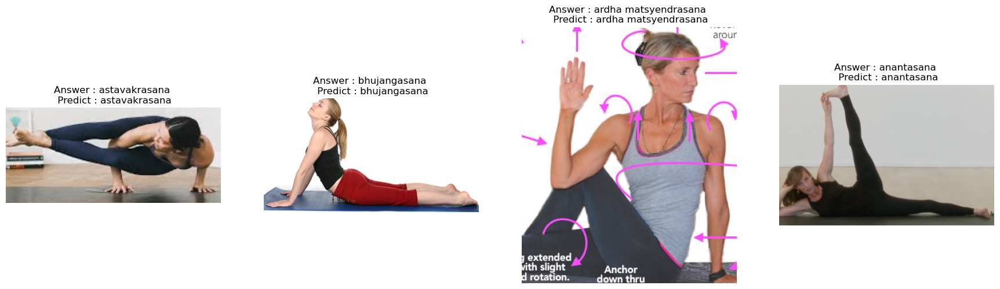

In [36]:
predict_images(test_flow, model_efficient, ncols=4)

#### 외부이미지 예측 수행

In [45]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.applications.efficientnet import preprocess_input as efficient_preprocess_input

def get_prediction_from_web(image, model):
    
    image = cv2.resize(image, (150, 150))
    image = efficient_preprocess_input(image)
    image = img_to_array(image)
    
    image = np.expand_dims(image, axis=0)
    prediction = model.predict(image)

    predicted_class_index = np.argmax(prediction)
    
    return predicted_class_index

def show_image(image):
    plt.figure(figsize=(4, 4))
    plt.imshow(image)
    plt.axis('off')


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
18
{'adho mukha svanasana': 0, 'adho mukha vriksasana': 1, 'agnistambhasana': 2, 'ananda balasana': 3, 'anantasana': 4, 'anjaneyasana': 5, 'ardha bhekasana': 6, 'ardha chandrasana': 7, 'ardha matsyendrasana': 8, 'ardha pincha mayurasana': 9, 'ardha uttanasana': 10, 'ashtanga namaskara': 11, 'astavakrasana': 12, 'baddha konasana': 13, 'bakasana': 14, 'balasana': 15, 'bhairavasana': 16, 'bharadvajasana i': 17, 'bhekasana': 18, 'bhujangasana': 19, 'bhujapidasana': 20, 'bitilasana': 21, 'camatkarasana': 22, 'chakravakasana': 23, 'chaturanga dandasana': 24, 'dandasana': 25, 'dhanurasana': 26, 'durvasasana': 27, 'dwi pada viparita dandasana': 28, 'eka pada koundinyanasana i': 29, 'eka pada koundinyanasana ii': 30, 'eka pada rajakapotasana': 31, 'eka pada rajakapotasana ii': 32, 'ganda bherundasana': 33, 'garbha pindasana': 34, 'garudasana': 35, 'gomukhasana': 36, 'halasana': 37, 'hanumanasana': 38, 'janu sirsasana': 39, 'kapotasana': 40, 'krounchasana': 

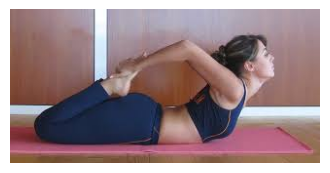

In [46]:
import numpy as np
from tensorflow.keras.preprocessing.image import load_img, img_to_array

#image = load_img('./datasets/Rock_Scissors_Paper/deffdongs_scissor.jpg', target_size=(224, 224))
image = cv2.imread('./datasets/Yoga/bhekasana.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

prediction = get_prediction_from_web(image, model_efficient)
show_image(image)
print(prediction)
print(test_flow.class_indices)


### Cycle 8
- VGG 모델 확인

In [47]:
from tensorflow.keras.losses import CategoricalCrossentropy
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.metrics import Accuracy

model_vgg = create_model(model_name='vgg16', verbose=True)
model_vgg.compile(optimizer=Adam(5e-4), loss=CategoricalCrossentropy(), metrics=['acc'])

Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)           │ (None, 150, 150, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv1 (Conv2D)                │ (None, 150, 150, 64)        │           1,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv2 (Conv2D)                │ (None, 150, 150, 64)        │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_pool (MaxPooling2D)           │ (None, 75, 75, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv1 (Conv2D)                │ (None, 75, 75, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv2 (Conv2D)                │ (None, 75, 75, 128)         │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_pool (MaxPooling2D)           │ (None, 37, 37, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv1 (Conv2D)                │ (None, 37, 37, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv2 (Conv2D)                │ (None, 37, 37, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv3 (Conv2D)                │ (None, 37, 37, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_pool (MaxPooling2D)           │ (None, 18, 18, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv1 (Conv2D)                │ (None, 18, 18, 512)         │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv2 (Conv2D)                │ (None, 18, 18, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv3 (Conv2D)                │ (None, 18, 18, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_pool (MaxPooling2D)           │ (None, 9, 9, 512)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv1 (Conv2D)                │ (None, 9, 9, 512)           │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv2 (Conv2D)                │ (None, 9, 9, 512)           │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv3 (Conv2D)                │ (None, 9, 9, 512)           │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_pool (MaxPooling2D)           │ (None, 4, 4, 512)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d_1           │ (None, 512)                 │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 500)                 │         256,5

 Total params: 15,024,795 (57.32 MB)

 Trainable params: 15,024,795 (57.32 MB)

 Non-trainable params: 0 (0.00 B)

In [48]:
N_EPOCHS = 20

history = model_vgg.fit(train_dataset,
                    batch_size=BATCH_SIZE,
                    epochs=N_EPOCHS, 
                    validation_data=validation_dataset,
                    callbacks=[mcp_cb, rlr_cb, ely_cb])



Epoch 1/20
60/60 ━━━━━━━━━━━━━━━━━━━━ 161s 3s/step - acc: 0.0115 - loss: 6.8267 - val_acc: 0.0146 - val_loss: 4.6710 - learning_rate: 5.0000e-04
Epoch 2/20
60/60 ━━━━━━━━━━━━━━━━━━━━ 153s 3s/step - acc: 0.0172 - loss: 4.6706 - val_acc: 0.0146 - val_loss: 4.6690 - learning_rate: 5.0000e-04
Epoch 3/20
60/60 ━━━━━━━━━━━━━━━━━━━━ 155s 3s/step - acc: 0.0109 - loss: 4.6687 - val_acc: 0.0146 - val_loss: 4.6669 - learning_rate: 5.0000e-04
Epoch 4/20
60/60 ━━━━━━━━━━━━━━━━━━━━ 153s 3s/step - acc: 0.0180 - loss: 4.6660 - val_acc: 0.0146 - val_loss: 4.6646 - learning_rate: 5.0000e-04
Epoch 5/20
60/60 ━━━━━━━━━━━━━━━━━━━━ 153s 3s/step - acc: 0.0142 - loss: 4.6629 - val_acc: 0.0146 - val_loss: 4.6620 - learning_rate: 5.0000e-04
Epoch 6/20
60/60 ━━━━━━━━━━━━━━━━━━━━ 154s 3s/step - acc: 0.0143 - loss: 4.6618 - val_acc: 0.0146 - val_loss: 4.6592 - learning_rate: 5.0000e-04
Epoch 7/20
60/60 ━━━━━━━━━━━━━━━━━━━━ 154s 3s/step - acc: 0.0102 - loss: 4.6608 - val_acc: 0.0146 - val_loss: 4.6563 - learning_ra

성능이 좋지 않음을 알 수 있었습니다.

---
### 각 Cycle 별 모델과 epoch, learning_rate 시각화

1 Cycle : resnet50 , epoch : 10/10, learning_rate : default   
acc : 0.7923, loss : 0.6484   
val_acc: 0.6131, val_loss: 1.5691  
test acc: 0.6549, loss: 1.3843  
  
2 Cycle : resnet50 , epoch : 20/20, learning_rate = default  
acc : 0.9311, loss : 0.2236  
val_acc : 0.5328, val_loss : 2.3378  
test_acc : 0.5474, test_loss : 2.2350  
  
3 Cycle : resnet50 , epoch : 20/20, learning_rate = 1e-5  
acc : 0.2391, loss : 3.4028  
val_acc : 0.1929, val_loss : 3.9271  
  
수치가 너무 낮아서 확인하지 않음.  
  
4 Cycle : resnet50 / epoch : 15/80, learning_rate = 5e-4  
acc : 0.9435, loss : 0.1973  
val_acc : 0.5839, val_loss : 2.1181  
test_acc : 0.5990, test_loss : 1.9288  
  
- early stopping 되었지만 history 확인  
  
5 Cycle : resnet50 / epoch : 20/20, learning_rate = 5e-4  
albumentation 적용  
- ShiftScaleRotate
- HorizontalFlip
- GaussNoise
- RandomBrightnessContrast
  
acc : 0.7447 , loss : 0.8601  
val_acc : 0.5954, val_loss : 1.6137  
test_acc : 0.6690, test_loss : 1.4335  
  
6 Cycle : MobileNet / epoch : 8/20, learning_rate = 5e-4  
albumentation 적용  
- ShiftScaleRotate  
- HorizontalFlip  
- GaussNoise
- RandomBrightnessContrast
  
acc: 0.4906, loss: 1.8437  
val_acc: 0.1773, val_loss: 4.2066

성능이 낮게나오고, early_stopping이 발생


7 Cycle : EfficientNet / epoch : 20/20, learning_rate = 5e-4  
albumentation 적용  
- ShiftScaleRotate  
- HorizontalFlip  
- GaussNoise  
- RandomBrightnessContrast
   
acc: 0.8959, loss: 0.3304   
val_acc: 0.7132, val_loss: 1.4324  
test_acc: 0.7300, test_loss: 1.2517  
  
8 Cycle : VGG16 / epoch : 8/20, learning_rate = 5e-4  
albumentation 적용
- ShiftScaleRotate
- HorizontalFlip
- GaussNoise
- RandomBrightnessContrast
  
acc: 0.0126, loss: 4.6584  
val_acc: 0.0146, val_loss: 4.6538  




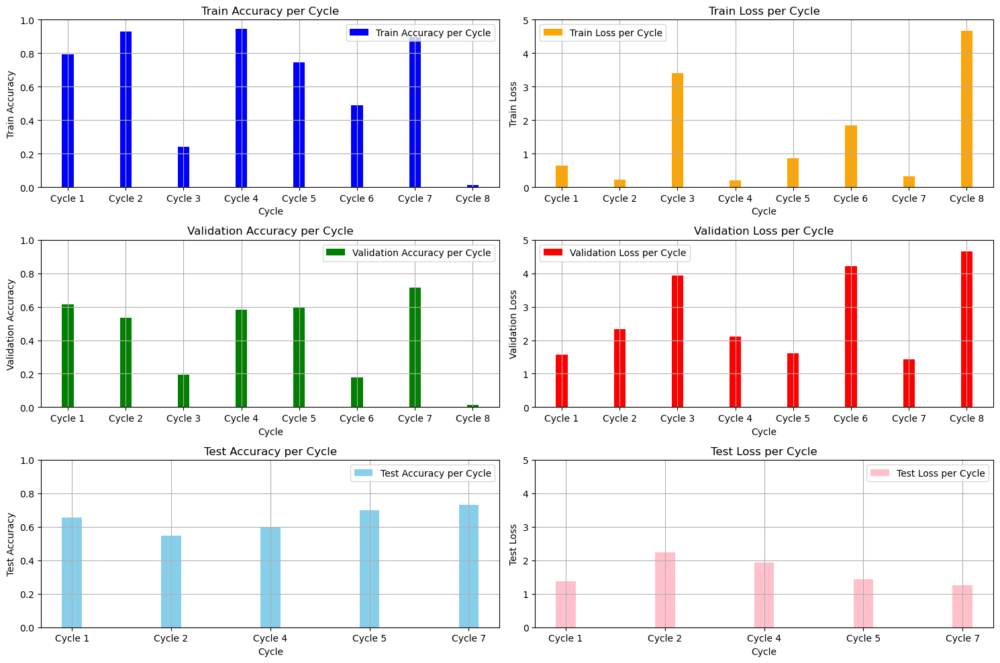

In [8]:
import numpy as np
import matplotlib.pyplot as plt

# Data for each cycle
cycle_labels = ['Cycle 1', 'Cycle 2', 'Cycle 3', 'Cycle 4', 'Cycle 5', 'Cycle 6', 'Cycle 7', 'Cycle 8']
acc = [0.7923, 0.9311, 0.2391, 0.9435, 0.7447, 0.4906, 0.8959, 0.0126]
loss = [0.6484, 0.2236, 3.4028, 0.1973, 0.8601, 1.8437, 0.3304, 4.6584]
val_acc = [0.6131, 0.5328, 0.1929, 0.5839, 0.5954, 0.1773, 0.7132, 0.0146]
val_loss = [1.5691, 2.3378, 3.9271, 2.1181, 1.6137, 4.2066, 1.4324, 4.6538]

test_cycle_labels = ['Cycle 1', 'Cycle 2', 'Cycle 4', 'Cycle 5', 'Cycle 7']
test_acc = [0.6549, 0.5474, 0.5990, 0.6990, 0.7300]
test_loss = [1.3843, 2.2350, 1.9288, 1.4335, 1.2517]

# Plotting
x = np.arange(len(cycle_labels))
x_test = np.arange(len(test_cycle_labels))
width = 0.2

fig, axs = plt.subplots(3, 2, figsize=(15, 10))

# Training accuracy
axs[0, 0].bar(x, acc, width, label='Train Accuracy per Cycle', color='blue')
axs[0, 0].set_title('Train Accuracy per Cycle')
axs[0, 0].set_xlabel('Cycle')
axs[0, 0].set_ylabel('Train Accuracy')
axs[0, 0].set_xticks(x)
axs[0, 0].set_xticklabels(cycle_labels)
axs[0, 0].set_ylim(0.0, 1.0)
axs[0, 0].legend()
axs[0, 0].grid(True)

# Training loss
axs[0, 1].bar(x, loss, width, label='Train Loss per Cycle', color='orange')
axs[0, 1].set_title('Train Loss per Cycle')
axs[0, 1].set_xlabel('Cycle')
axs[0, 1].set_ylabel('Train Loss')
axs[0, 1].set_xticks(x)
axs[0, 1].set_xticklabels(cycle_labels)
axs[0, 1].set_ylim(0.0, 5.0)
axs[0, 1].legend()
axs[0, 1].grid(True)

# Validation accuracy
axs[1, 0].bar(x, val_acc, width, label='Validation Accuracy per Cycle', color='green')
axs[1, 0].set_title('Validation Accuracy per Cycle')
axs[1, 0].set_xlabel('Cycle')
axs[1, 0].set_ylabel('Validation Accuracy')
axs[1, 0].set_xticks(x)
axs[1, 0].set_xticklabels(cycle_labels)
axs[1, 0].set_ylim(0.0, 1.0)
axs[1, 0].legend()
axs[1, 0].grid(True)

# Validation loss
axs[1, 1].bar(x, val_loss, width, label='Validation Loss per Cycle', color='red')
axs[1, 1].set_title('Validation Loss per Cycle')
axs[1, 1].set_xlabel('Cycle')
axs[1, 1].set_ylabel('Validation Loss')
axs[1, 1].set_xticks(x)
axs[1, 1].set_xticklabels(cycle_labels)
axs[1, 1].set_ylim(0.0, 5.0)
axs[1, 1].legend()
axs[1, 1].grid(True)

# Test accuracy
axs[2, 0].bar(x_test, test_acc, width, label='Test Accuracy per Cycle', color='skyblue')
axs[2, 0].set_title('Test Accuracy per Cycle')
axs[2, 0].set_xlabel('Cycle')
axs[2, 0].set_ylabel('Test Accuracy')
axs[2, 0].set_xticks(x_test)
axs[2, 0].set_xticklabels(test_cycle_labels)
axs[2, 0].set_ylim(0.0, 1.0)
axs[2, 0].legend()
axs[2, 0].grid(True)

# Test loss
axs[2, 1].bar(x_test, test_loss, width, label='Test Loss per Cycle', color='pink')
axs[2, 1].set_title('Test Loss per Cycle')
axs[2, 1].set_xlabel('Cycle')
axs[2, 1].set_ylabel('Test Loss')
axs[2, 1].set_xticks(x_test)
axs[2, 1].set_xticklabels(test_cycle_labels)
axs[2, 1].set_ylim(0.0, 5.0)
axs[2, 1].legend()
axs[2, 1].grid(True)


plt.tight_layout()
plt.show()
